In [276]:
import pandas as pd
import numpy as np
import tensorflow as tf
import torch.nn as nn
from torchvision.transforms import transforms
import cv2
import os
from torch.utils.data import DataLoader,Dataset,dataset


In [3]:
import torch

In [23]:
class generator(nn.Module):
    def __init__(self,z_dim=100,text_dim=100,channels=3):
        super(generator,self).__init__()
        self.fc=nn.Sequential(
        nn.Linear(z_dim+text_dim,512),
        nn.ReLU(),
        nn.Linear(512,64*16*16),
        nn.ReLU())
        self.conv=nn.Sequential(
            nn.ConvTranspose2d(channels,32,4,stride=2,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(32,channels,4,stride=2,padding=1),
            nn.Tanh())
    def forward(self,noise,text_embedding):
        text_embedding=text_embedding.expand(noise.shape[0],-1)
        x=torch.cat((noise,text_embedding),dim=1)
        x=self.fc(x)
        x=x.view(x.shape[0],64,16,16)
        return self.conv(x)

In [25]:
generator=generator()

In [27]:
generator

generator(
  (fc): Sequential(
    (0): Linear(in_features=200, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=16384, bias=True)
    (3): ReLU()
  )
  (conv): Sequential(
    (0): ConvTranspose2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(32, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): Tanh()
  )
)

In [371]:
class Descriminator(nn.Module):
    def __init__(self,text_dim=100,channels=3):
        super(Descriminator,self).__init__()
        self.conv=nn.Sequential(
        nn.ConvTranspose2d(channels,32,4,stride=2,padding=1),
        nn.BatchNorm2d(32),
        nn.LeakyReLU(0.2,inplace=True),
        nn.ConvTranspose2d(32,64,4,stride=2,padding=1),
        nn.LeakyReLU(0.2,inplace=True))
        
        self.fc=nn.Sequential(
        nn.Linear(64*16*16+text_dim,512),
        nn.LeakyReLU(0.2,inplace=True),
        nn.Linear(512,1),
        nn.Sigmoid())
    def forward(self,Video_frames,text_embedding):
        x=self.conv(Video_frames)
        x=x.view(x.shape[0],64,16,16)
        text_embedding=text_embedding.expand(x.shape[0],-1)
        x=torch.cat((x,text_embedding),dim=1)
        return self.fc(x)
        

In [373]:
64*16*16

16384

In [375]:
descriminator=Descriminator()

In [377]:
descriminator

Descriminator(
  (conv): Sequential(
    (0): ConvTranspose2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): ConvTranspose2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (fc): Sequential(
    (0): Linear(in_features=16484, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Linear(in_features=512, out_features=1, bias=True)
    (3): Sigmoid()
  )
)

In [379]:
import nltk

In [ ]:
from gensim.models import Word2Vec

In [ ]:
d={"Video_path":["C:/Users/Naveen kumar/Downloads/Dog runing towards the forest area.mp4","C:/Users/Naveen kumar/Downloads/Two dogs are playing together.mp4",
                 "C:/Users/Naveen kumar/Downloads/Dog walking on the snow.mp4","C:/Users/Naveen kumar/Downloads/The dog comes with a blue ring in its mouth.mp4",
                 "C:/Users/Naveen kumar/Downloads/Dog jumping over the grass.mp4"],
   "Out_path":["C:/Users/Naveen kumar/Downloads/Dog runing towards the forest area","C:/Users/Naveen kumar/Downloads/Two dogs are playing together",
               "C:/Users/Naveen kumar/Downloads/Dog walking on the snow","C:/Users/Naveen kumar/Downloads/The dog comes with a blue ring in its mouth",
               "C:/Users/Naveen kumar/Downloads/Dog jumping over the grass"]}

In [ ]:
df=pd.DataFrame(d)

In [ ]:
df

In [ ]:
dict={"Video_path":df["Out_path"],
    "Label_txt":["Dog runing towards the forest area","Two dogs are playing together","Dog walking on the snow",
                "The dog comes with a blue ring in its mouth","Dog jumping over the grass"]}

In [ ]:
df=pd.DataFrame(dict)

In [ ]:
df

In [ ]:
sent=[nltk.word_tokenize(text.lower()) for text in df["Label_txt"]]

In [ ]:
sent

In [ ]:
word=Word2Vec(sent,vector_size=100,min_count=1)

In [ ]:
for tok in df["Label_txt"]:
    tok=nltk.word_tokenize(tok.lower())
    print(len(tok))
    tok=[word.wv[tokn] for tokn in tok if tokn in word.wv] 
    print(len(tok))
    print("*********************")
    break

In [ ]:
np.mean(tok,axis=0) if tok else np.zeros(100)

In [ ]:
def Text_Embedding(text):
    text=nltk.word_tokenize(text.lower())
    text=[word.wv[tex] for tex in text if tex in word.wv]
    return np.mean(text,axis=0) if text else np.zeros(100)

In [143]:
df["Text_Embedding"]=df["Label_txt"].apply(Text_Embedding)

In [145]:
df

,Video_path,Label_txt,Text_Embedding
0,C:/Users/Naveen kumar/Downloads/Dog runing tow...,Dog runing towards the forest area,"[-0.0041886964, 0.0020205264, 0.00016344954, 0..."
1,C:/Users/Naveen kumar/Downloads/Two dogs are p...,Two dogs are playing together,"[0.0020580166, 0.00088660495, 0.0029211687, 0...."
2,C:/Users/Naveen kumar/Downloads/Dog walking on...,Dog walking on the snow,"[-0.0012673392, 0.0029671425, 0.001582376, -0...."
3,C:/Users/Naveen kumar/Downloads/The dog comes ...,The dog comes with a blue ring in its mouth,"[0.0005776034, 0.001271901, 0.0024885596, 0.00..."
4,C:/Users/Naveen kumar/Downloads/Dog jumping ov...,Dog jumping over the grass,"[-0.004621568, 0.00046057737, 0.0038914985, -0..."


In [147]:
len(df["Text_Embedding"][1])

100

In [164]:
import glob
from PIL import Image

In [162]:
sorted(glob.glob(f"{df["Video_path"][1]}/*jpg"))

['C:/Users/Naveen kumar/Downloads/Two dogs are playing together\\frame_0000.jpg',
 'C:/Users/Naveen kumar/Downloads/Two dogs are playing together\\frame_0001.jpg',
 'C:/Users/Naveen kumar/Downloads/Two dogs are playing together\\frame_0002.jpg',
 'C:/Users/Naveen kumar/Downloads/Two dogs are playing together\\frame_0003.jpg',
 'C:/Users/Naveen kumar/Downloads/Two dogs are playing together\\frame_0004.jpg',
 'C:/Users/Naveen kumar/Downloads/Two dogs are playing together\\frame_0005.jpg',
 'C:/Users/Naveen kumar/Downloads/Two dogs are playing together\\frame_0006.jpg',
 'C:/Users/Naveen kumar/Downloads/Two dogs are playing together\\frame_0007.jpg',
 'C:/Users/Naveen kumar/Downloads/Two dogs are playing together\\frame_0008.jpg',
 'C:/Users/Naveen kumar/Downloads/Two dogs are playing together\\frame_0009.jpg',
 'C:/Users/Naveen kumar/Downloads/Two dogs are playing together\\frame_0010.jpg',
 'C:/Users/Naveen kumar/Downloads/Two dogs are playing together\\frame_0011.jpg',
 'C:/Users/Navee

In [168]:
img=Image.open('C:/Users/Naveen kumar/Downloads/Two dogs are playing together\\frame_0221.jpg').convert("RGB")

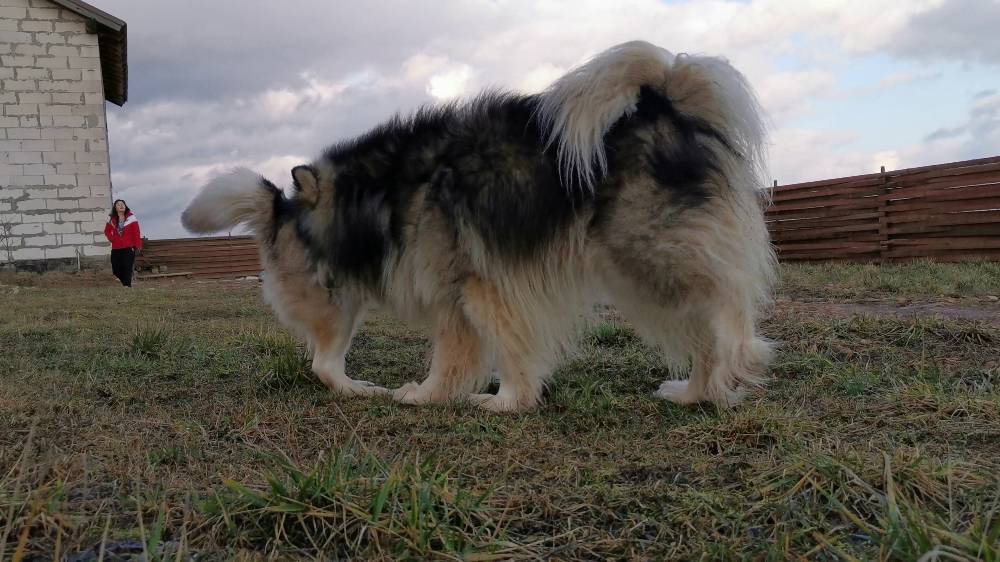

In [170]:
img

In [174]:
from torchvision.transforms import transforms

In [242]:
transform=transforms.Compose([transforms.Resize((64,64)),transforms.ToTensor(),])

In [188]:
img2=cv2.imread('C:/Users/Naveen kumar/Downloads/Two dogs are playing together\\frame_0221.jpg')

In [226]:
transform(img)

tensor([[[0.5647, 0.5059, 0.4078,  ..., 0.7490, 0.7412, 0.7569],
         [0.5725, 0.5412, 0.5098,  ..., 0.7255, 0.7294, 0.7294],
         [0.5608, 0.5255, 0.5333,  ..., 0.7137, 0.7137, 0.7020],
         ...,
         [0.2196, 0.2784, 0.2157,  ..., 0.3333, 0.2745, 0.2510],
         [0.2667, 0.2824, 0.2000,  ..., 0.2784, 0.2471, 0.2706],
         [0.2784, 0.2392, 0.1529,  ..., 0.3020, 0.2353, 0.2078]],

        [[0.5412, 0.4824, 0.3725,  ..., 0.7647, 0.7608, 0.7765],
         [0.5529, 0.5137, 0.4784,  ..., 0.7451, 0.7451, 0.7490],
         [0.5451, 0.5020, 0.5020,  ..., 0.7333, 0.7294, 0.7255],
         ...,
         [0.1882, 0.2157, 0.1961,  ..., 0.3490, 0.2941, 0.2706],
         [0.2353, 0.2275, 0.1765,  ..., 0.2784, 0.2784, 0.2824],
         [0.2510, 0.2000, 0.1412,  ..., 0.2941, 0.2392, 0.2392]],

        [[0.5059, 0.4431, 0.3255,  ..., 0.8118, 0.8078, 0.8157],
         [0.5137, 0.4745, 0.4353,  ..., 0.7922, 0.7922, 0.7961],
         [0.5020, 0.4667, 0.4627,  ..., 0.7804, 0.7804, 0.

In [228]:
import matplotlib.pyplot as plt

In [316]:
data=[]

In [318]:
for i,p in enumerate(df["Video_path"]):
    frames=sorted(glob.glob(f"{p}/*.jpg"))
    frames=[Image.open(img).convert("RGB") for img in frames]
    if transform:
        imags=[ transform(img) for img in frames]
    embedding=torch.tensor(df.iloc[i]['Text_Embedding'],dtype=torch.float16)
    d=(torch.stack(imags),embedding)
    data.append(d)
                  

In [320]:
Dataloader=DataLoader(data)

#### Checking device

In [323]:
device=torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [325]:
device

device(type='cpu')

#### Adding Device to genorator and Descriminator 

In [328]:
generator.to(device)

generator(
  (fc): Sequential(
    (0): Linear(in_features=200, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=16384, bias=True)
    (3): ReLU()
  )
  (conv): Sequential(
    (0): ConvTranspose2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(32, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): Tanh()
  )
)

In [330]:
descriminator.to(device)

Descriminator(
  (conv): Sequential(
    (0): ConvTranspose2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): ConvTranspose2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (fc): Sequential(
    (0): Linear(in_features=16484, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Linear(in_features=512, out_features=1, bias=True)
    (3): Sigmoid()
  )
)

In [332]:
import torch.optim as optim

In [361]:
descriminator.parameters()

<generator object Module.parameters at 0x000001A43B6498C0>

In [335]:
optimizer_G=optim.Adam(generator.parameters(),lr=0.0002,betas=(0.5,0.999))
optimizer_D=optim.Adam(descriminator.parameters(),lr=0.0002,betas=(0.5,0.999))

In [351]:
critarion=nn.BCELoss()


In [359]:
epoches=100
for epoch in range(epoches):
    for video_frame,text_embedding in data:
        video_frame,text_embedding=video_frame.to(device),text_embedding.to(device)
        optimizer_D.zero_grad()
        real_label=torch.ones(video_frame.size(0),1).to(device)
        fake_label=torch.zeros(video_frame.size(0),1).to(device)
        real_loss=critarion(descriminator(video_frame,text_embedding),real_label)
        noise=torch.randn(video_frame.size(0),100).to(device)
        fake_video=generator(noise,text_embedding)
        fake_loss=critarion(descriminator(fake_video.detach(),text_embedding),fake_label)
        d_loss=real_loss+fake_loss
        d_loss.backward()
        optimizer_D.step()
        optimizer_G.zero_grad()
        g_loss=critarion(descriminator(fake_video,text_embedding),fake_label)
        g_loss.backward()
        optimizer_G.step()
    print(f"{epoch+1/epoches},D_loss:{d_loss.item()},G_loss{g_loss.item()}")

torch.save(generator.state_dict(),"Video_gen.pth")

RuntimeError: mat1 and mat2 shapes cannot be multiplied (182x4194404 and 16484x512)

In [355]:
torch.randn(182,100).shape

torch.Size([182, 100])

In [339]:
realv=data[0][0]

In [341]:
te=data[0][1]

In [345]:
realv.size(0)

182

In [349]:
len(torch.ones(realv.size(0),1).to(device))

182

In [367]:
16484*64

1054976